# **Importing Necessary Modules**


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns
import os
import plotly.express as px
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import tensorflow as tf
from tensorflow.keras import models, layers
from tensorflow import keras
from tensorflow.keras.applications import EfficientNetB0,ResNet50
from tensorflow.keras.layers import BatchNormalization, Dense, Dropout,GlobalAveragePooling2D
from tensorflow.keras.optimizers import Adamax
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping
import pickle
from tensorflow.keras.models import load_model
from sklearn.metrics import confusion_matrix, classification_report
!pip install pyngrok

import warnings
warnings.filterwarnings('ignore')

# **Creating the Training DataFrame**

In [2]:
train_dir = "C:/Users/User/Desktop/Master/Sem 2/DSC 761 - Advance Data Science Technology/Group Project/Data/train"
test_dir = "C:/Users/User/Desktop/Master/Sem 2/DSC 761 - Advance Data Science Technology/Group Project/Data/valid"

def create_df(path):
  data=[]
  for folder in os.listdir(path):
    for file in os.listdir(os.path.join(path,folder)):
     data.append(["C:/Users/User/Desktop/Master/Sem 2/DSC 761 - Advance Data Science Technology/Group Project/Data/train/" + folder + '/' + file, folder.split('-')[-1]])
  return pd.DataFrame(data,columns=['filename','label'])


train_df = create_df( train_dir )
train_df.head(10)

FileNotFoundError: [Errno 2] No such file or directory: 'C:/Users/User/Desktop/Master/Sem 2/DSC 761 - Advance Data Science Technology/Group Project/Data/train'

# **Creating the Testing DataFrame**

In [ ]:
def create_validation_df(path):
  validation_data=[]
  for folder in os.listdir(path):
    for file in os.listdir(os.path.join(path,folder)):
      validation_data.append(["C:/Users/User/Desktop/Master/Sem 2/DSC 761 - Advance Data Science Technology/Group Project/Data/valid/"+ folder + '/'+file,folder.split('-')[-1]])
  return pd.DataFrame(validation_data,columns=['filename','label'])


test_df = create_validation_df( test_dir )

test_df.head(10)

,filename,label
0,C:/Users/User/Desktop/Master/Sem 2/DSC 761 - A...,Bacterial_spot
1,C:/Users/User/Desktop/Master/Sem 2/DSC 761 - A...,Bacterial_spot
2,C:/Users/User/Desktop/Master/Sem 2/DSC 761 - A...,Bacterial_spot
3,C:/Users/User/Desktop/Master/Sem 2/DSC 761 - A...,Bacterial_spot
4,C:/Users/User/Desktop/Master/Sem 2/DSC 761 - A...,Bacterial_spot
5,C:/Users/User/Desktop/Master/Sem 2/DSC 761 - A...,Bacterial_spot
6,C:/Users/User/Desktop/Master/Sem 2/DSC 761 - A...,Bacterial_spot
7,C:/Users/User/Desktop/Master/Sem 2/DSC 761 - A...,Bacterial_spot
8,C:/Users/User/Desktop/Master/Sem 2/DSC 761 - A...,Bacterial_spot
9,C:/Users/User/Desktop/Master/Sem 2/DSC 761 - A...,Bacterial_spot


# **Count Plot to Visualize the Label Distribution in train_df**

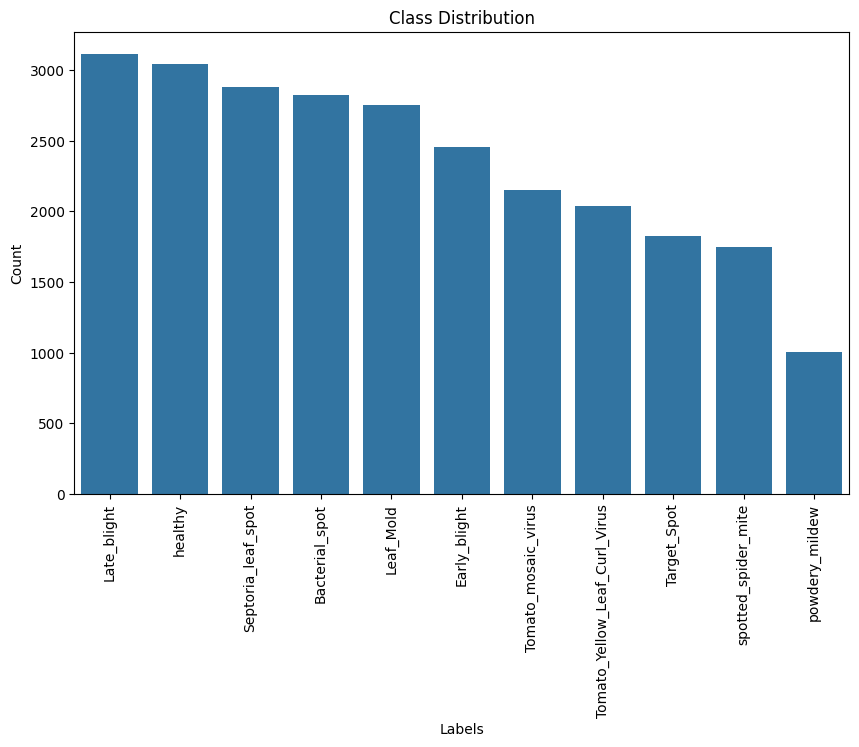

In [ ]:
label_counts = train_df["label"].value_counts()

# Sorting the labels and reindex the dataframe
sorted_labels = label_counts.index
train_df["label"] = pd.Categorical(train_df["label"], categories = sorted_labels, ordered = True)

plt.figure(figsize = (10, 6))

# Creating the count plot
sns.countplot(x = train_df["label"], order = sorted_labels)
plt.xticks(rotation = 90)
plt.title("Class Distribution")
plt.xlabel("Labels")
plt.ylabel("Count")
plt.show()

# **Count Plot to Visualize the Label Distribution in test_df**

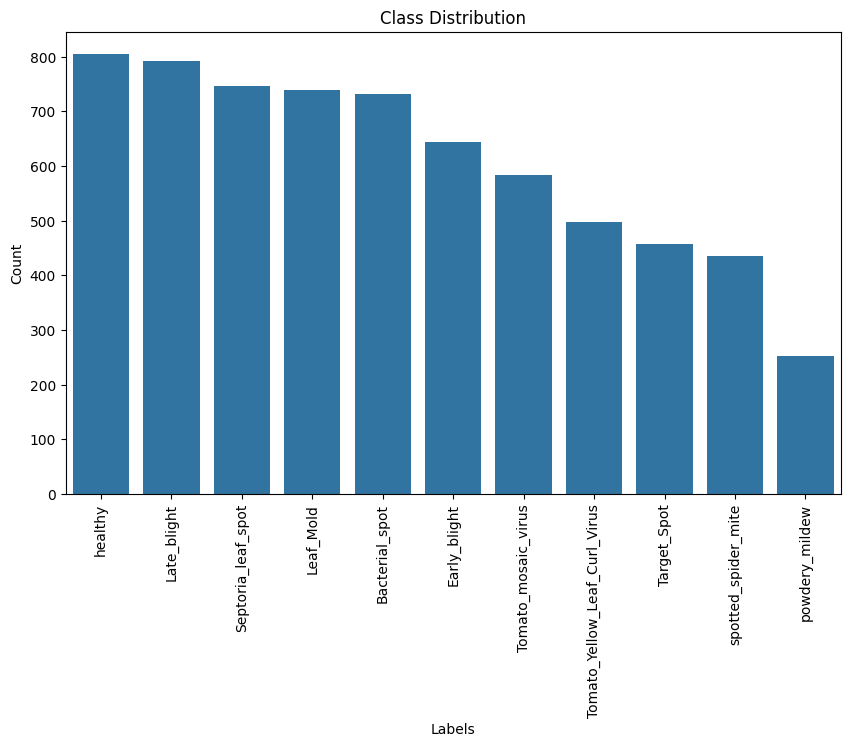

In [ ]:
label_counts = test_df["label"].value_counts()

# Sorting the labels and reindex the dataframe
sorted_labels = label_counts.index
test_df["label"] = pd.Categorical(test_df["label"], categories = sorted_labels, ordered = True)

plt.figure(figsize = (10, 6))

# Creating the count plot
sns.countplot(x = test_df["label"], order = sorted_labels)
plt.xticks(rotation = 90)
plt.title("Class Distribution")
plt.xlabel("Labels")
plt.ylabel("Count")
plt.show()

**Both count plots shows that there is class imbalance among the categories**

# **Creating the Pie Chart for train_df**

In [ ]:
fig = px.pie(train_df, names = 'label', title = "Disease Distribution in train_df", width = 600,  height = 400 )
fig.show()

# **Creating the Pie Chart for test_df**

In [ ]:
fig = px.pie(test_df, names = 'label', title = "Disease Distribution in test_df", width = 600,  height = 400 )
fig.show()

# **Displaying Sample Images**

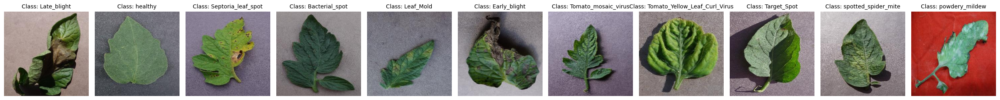

In [ ]:
samples = train_df.groupby('label').first().reset_index()

# Creating the subplots for each class
fig, axes = plt.subplots(1, len(samples), figsize = (25, 10))

# Displaying images with class labels
for ax, (img_path, img_label) in zip(axes, zip(samples['filename'], samples['label'])):
    ax.imshow(mpimg.imread(img_path))
    ax.set_title(f"Class: {img_label}", fontsize = 10)
    ax.axis('off')

plt.tight_layout()
plt.show()

# **Applying Train Test Split**

In [ ]:
X = train_df['filename']
y = train_df['label']

# train test split
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size = 0.2, random_state = 42)

# Converting into dataframes
train_df = pd.DataFrame(X_train)
train_df['label'] = y_train

val_df = pd.DataFrame( X_val )
val_df['label'] = y_val


# Printing the shape
print(f"Training set size: {len(X_train)} images")
print(f"Validation set size: {len(X_val)} images")

Training set size: 20669 images
Validation set size: 5168 images


# **Creating Data Generators**

In [ ]:
IMG_SIZE = 256
BATCH_SIZE = 32
Epochs = 50


train_datagen = ImageDataGenerator(rescale = 1/255.)
test_datagen = ImageDataGenerator(rescale = 1/255.)
val_datagen  = ImageDataGenerator(rescale = 1/255.)


# Create data generators from dataframes
train_generator = train_datagen.flow_from_dataframe(
    dataframe = train_df,
    x_col = "filename",
    y_col = "label",
    target_size = (IMG_SIZE, IMG_SIZE),
    class_mode = "categorical",
    batch_size = BATCH_SIZE
)

val_generator = val_datagen.flow_from_dataframe(
    dataframe = val_df,
    x_col = "filename",
    y_col = "label",
    target_size = (IMG_SIZE, IMG_SIZE),
    class_mode = "categorical",
    batch_size = BATCH_SIZE,
    shuffle = False
)

test_generator = test_datagen.flow_from_dataframe(
    dataframe = test_df,
    x_col = "filename",
    y_col = "label",
    target_size = (IMG_SIZE, IMG_SIZE),
    class_mode = "categorical",
    batch_size = BATCH_SIZE,
    shuffle = False
)

print(train_generator.class_indices)
print(val_generator.class_indices)
print(test_generator.class_indices)

Found 20669 validated image filenames belonging to 11 classes.
Found 5168 validated image filenames belonging to 11 classes.
Found 6682 validated image filenames belonging to 11 classes.
{'Bacterial_spot': 0, 'Early_blight': 1, 'Late_blight': 2, 'Leaf_Mold': 3, 'Septoria_leaf_spot': 4, 'Target_Spot': 5, 'Tomato_Yellow_Leaf_Curl_Virus': 6, 'Tomato_mosaic_virus': 7, 'healthy': 8, 'powdery_mildew': 9, 'spotted_spider_mite': 10}
{'Bacterial_spot': 0, 'Early_blight': 1, 'Late_blight': 2, 'Leaf_Mold': 3, 'Septoria_leaf_spot': 4, 'Target_Spot': 5, 'Tomato_Yellow_Leaf_Curl_Virus': 6, 'Tomato_mosaic_virus': 7, 'healthy': 8, 'powdery_mildew': 9, 'spotted_spider_mite': 10}
{'Bacterial_spot': 0, 'Early_blight': 1, 'Late_blight': 2, 'Leaf_Mold': 3, 'Septoria_leaf_spot': 4, 'Target_Spot': 5, 'Tomato_Yellow_Leaf_Curl_Virus': 6, 'Tomato_mosaic_virus': 7, 'healthy': 8, 'powdery_mildew': 9, 'spotted_spider_mite': 10}


# **Visualizing Sample Training Images with Class Labels**

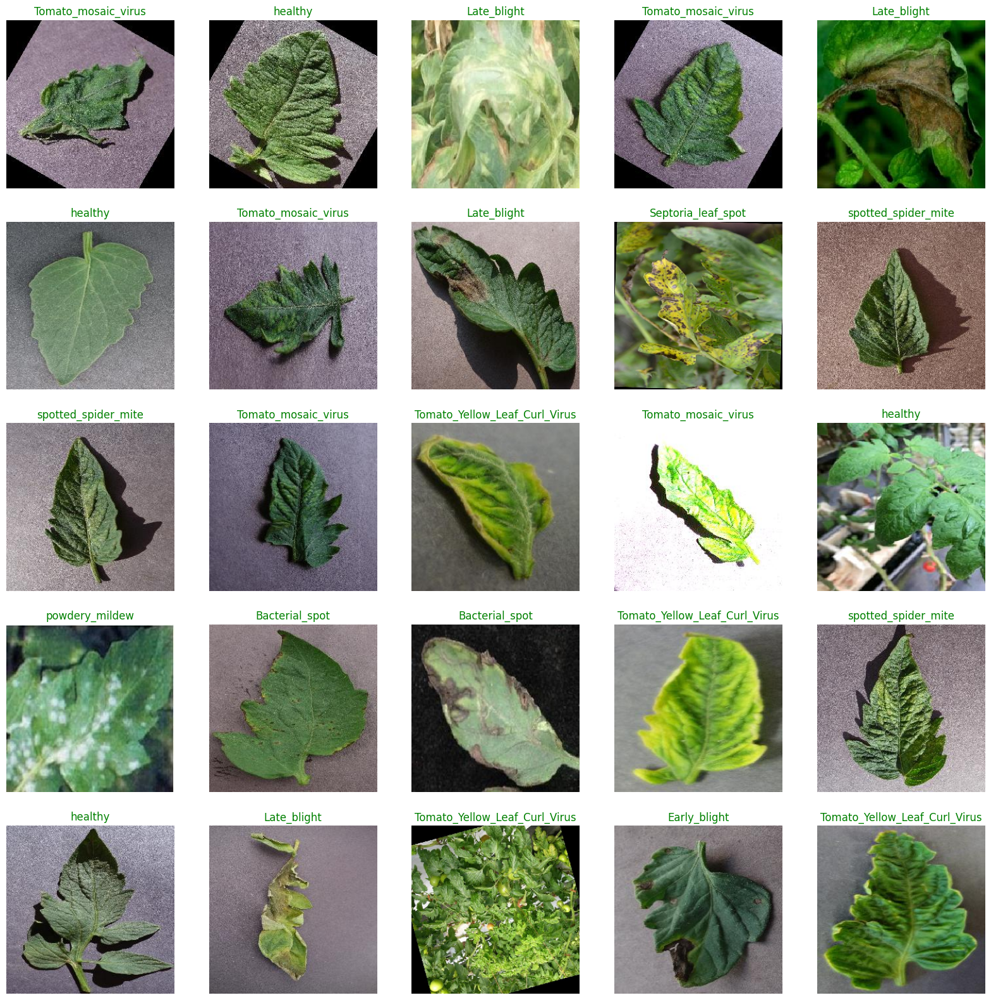

In [ ]:
def show_images(image_gen):
    class_dict = image_gen.class_indices
    classes = list(class_dict.keys())
    images, labels = next(image_gen)
    plt.figure(figsize=(20, 20))
    num_images = min(len(labels), 25)

    for i in range(num_images):
        plt.subplot(5, 5, i + 1)
        image = images[i]
        plt.imshow(image)
        index = np.argmax(labels[i])
        class_name = classes[index]
        plt.title(class_name, color="green", fontsize=12)
        plt.axis('off')
    plt.show()

show_images(train_generator)

# **Visualizing Sample Validation Images with Class Labels**

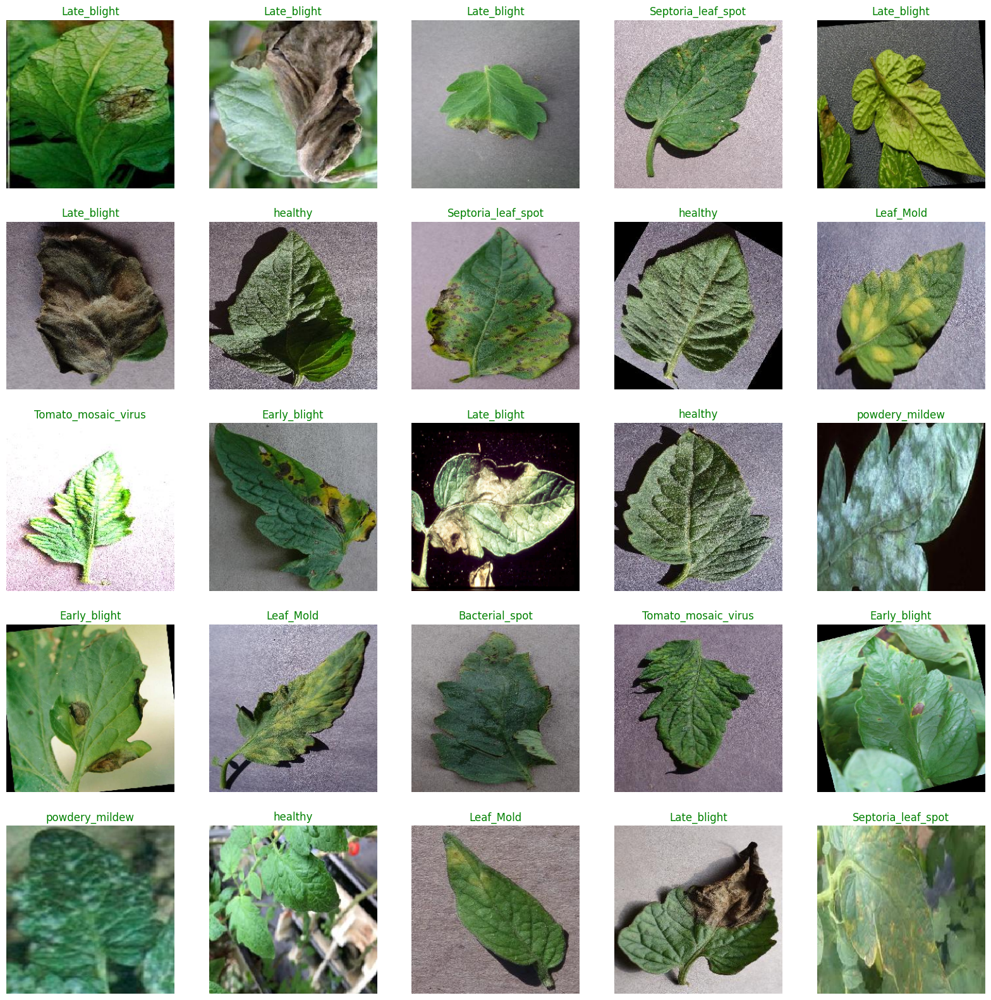

In [ ]:
show_images(val_generator)

# **Visualizing Sample Test Images with Class Labels**

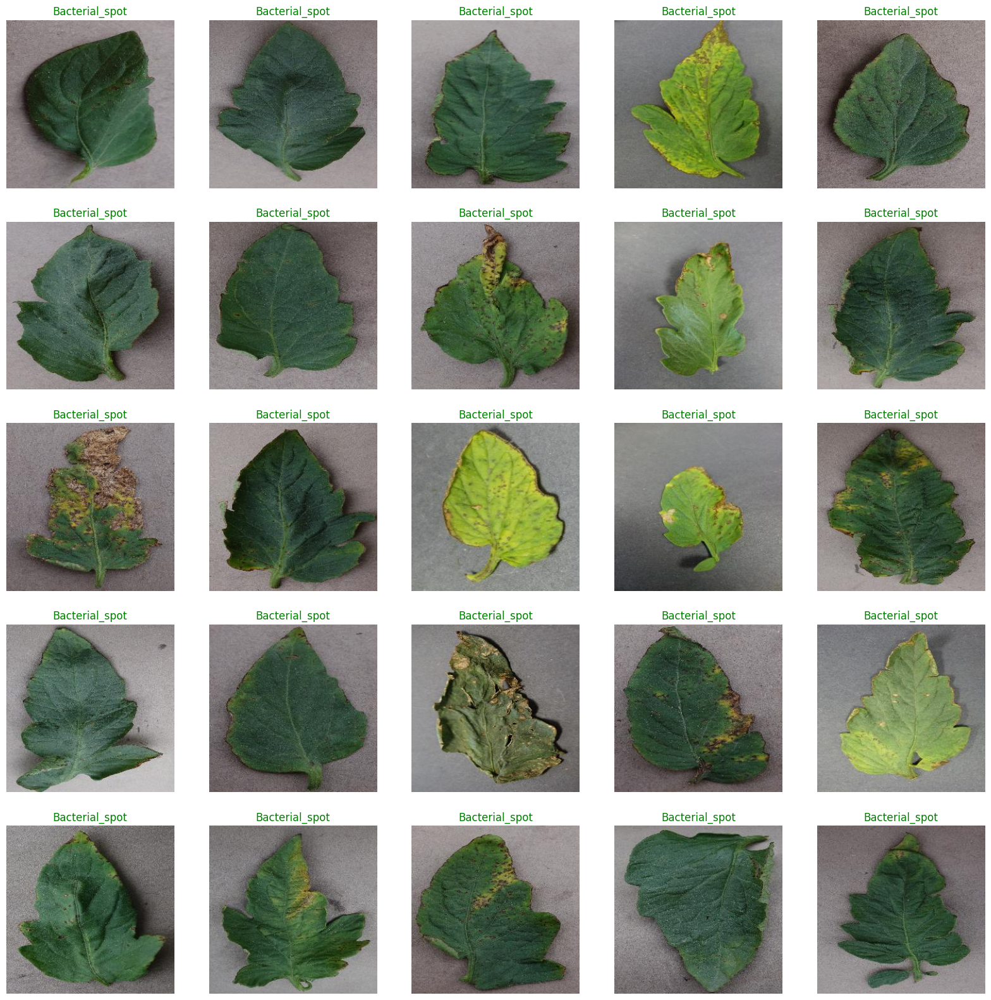

In [ ]:
show_images(test_generator)

<div style="text-align: center; font-size: 24px; font-weight: bold;">
Model Implementation<br>EfficientNetB0
</div>

In [ ]:
NUM_CLASSES = 11

base_model = EfficientNetB0(weights='imagenet', include_top = False, input_shape = (IMG_SIZE, IMG_SIZE, 3), pooling = 'max')
x = base_model.output
x = BatchNormalization(axis = -1, momentum = 0.99, epsilon = 0.001)(x)
x = Dense(128, activation='relu')(x)
x = Dropout(0.45)(x)
predictions = Dense(11, activation = 'softmax')(x)
model = Model(inputs = base_model.input, outputs = predictions)

optimizer = Adamax(learning_rate = 0.001)
model.compile(optimizer = optimizer, loss = 'categorical_crossentropy', metrics = ['accuracy'])

# **Applying the EarlyStopping Callback**

In [ ]:
early_stopping = EarlyStopping(
    monitor = 'val_loss',
    patience = 3,
    restore_best_weights = True,
    verbose = 1
)

# **Training the Model**

In [ ]:
history1 = model.fit(
    train_generator,
    epochs = 25,
    validation_data = val_generator,
    callbacks = [early_stopping]
)

Epoch 1/25
 71/646 ━━━━━━━━━━━━━━━━━━━━ 54:47 6s/step - accuracy: 0.3361 - loss: 2.2565

KeyboardInterrupt: 

# **Plotting the Model Performance**

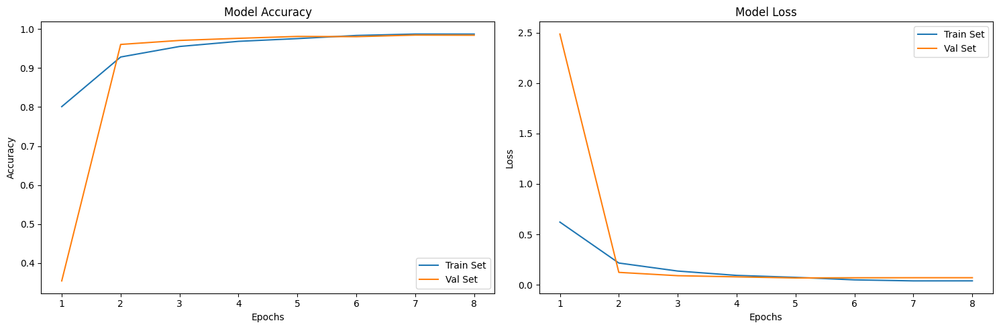

In [ ]:
acc = history1.history['accuracy']
val_acc = history1.history['val_accuracy']
loss = history1.history['loss']
val_loss = history1.history['val_loss']
epochs_range = range(1, len(history1.epoch) + 1)


plt.figure(figsize=(15,5))

plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Train Set')
plt.plot(epochs_range, val_acc, label='Val Set')
plt.legend(loc="best")
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Model Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Train Set')
plt.plot(epochs_range, val_loss, label='Val Set')
plt.legend(loc="best")
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Model Loss')

plt.tight_layout()
plt.show()

# **Saving the Trained EfficientB0 Model**

In [ ]:
model.save('Tomato_Disease_Prediction_EfficientB0.h5')

# **Pickling the Model History**

In [ ]:
history_dict = history1.history

with open("Tomato_Disease_Prediction_EfficientB0_history", "wb") as pickle_file:
    pickle.dump(history_dict, pickle_file)

print("Model history saved as Pickle!")

Model history saved as Pickle!


# **Preserving the Class Mappings**

In [ ]:
with open('Tomato_Disease_Prediction_EfficientB0_Class_Mappings.pkl', 'wb') as f:
    pickle.dump(train_generator.class_indices, f)

# **Loading the Trained EfficientB0 Model**

In [ ]:
EfficientB0_trained = load_model('/kaggle/input/trained-efficientb0/Tomato_Disease_Prediction_EfficientB0.h5')

# **Evaluating the Accuracy and Loss for the Training Set**

In [ ]:
EfficientB0_trained.evaluate(train_generator)

647/647 ━━━━━━━━━━━━━━━━━━━━ 72s 111ms/step - accuracy: 0.9981 - loss: 0.0079


[0.007611116394400597, 0.9982108473777771]

# **Evaluating the Accuracy and Loss for the Testing Set**

In [ ]:
EfficientB0_trained.evaluate(test_generator)

209/209 ━━━━━━━━━━━━━━━━━━━━ 23s 110ms/step - accuracy: 0.9782 - loss: 0.0974


[0.082427479326725, 0.9789016842842102]

# **Generating the Confusion Matrix**

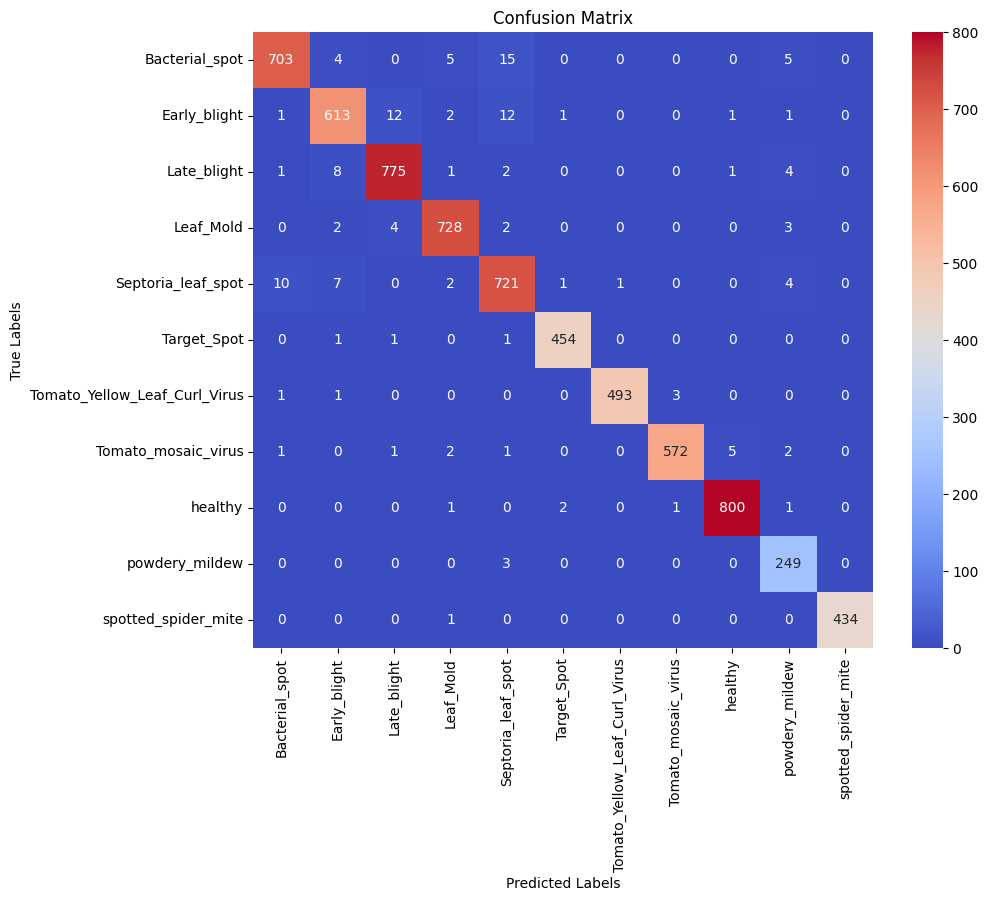

In [ ]:
test_generator.reset()
y_pred_prob = EfficientB0_trained.predict(test_generator)
y_pred = np.argmax(y_pred_prob, axis = 1)
y_true = test_generator.classes


cm = confusion_matrix(y_true, y_pred)

plt.figure(figsize = (10, 8))
sns.heatmap(cm, annot = True, fmt = 'd', cmap = 'coolwarm', xticklabels = test_generator.class_indices.keys(), yticklabels = test_generator.class_indices.keys())
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

# **Classification Report**

In [ ]:
print("Classification Report:")
print(classification_report(y_true, y_pred, target_names = test_generator.class_indices.keys()))

Classification Report:
                               precision    recall  f1-score   support

               Bacterial_spot       0.98      0.96      0.97       732
                 Early_blight       0.96      0.95      0.96       643
                  Late_blight       0.98      0.98      0.98       792
                    Leaf_Mold       0.98      0.99      0.98       739
           Septoria_leaf_spot       0.95      0.97      0.96       746
                  Target_Spot       0.99      0.99      0.99       457
Tomato_Yellow_Leaf_Curl_Virus       1.00      0.99      0.99       498
          Tomato_mosaic_virus       0.99      0.98      0.99       584
                      healthy       0.99      0.99      0.99       805
               powdery_mildew       0.93      0.99      0.96       252
          spotted_spider_mite       1.00      1.00      1.00       435

                     accuracy                           0.98      6683
                    macro avg       0.98      0.98  

<div style="text-align: center; font-size: 24px; font-weight: bold;">
Model Implementation<br>Simple CNN
</div>

# **Defining a Simple CNN Architecture**

In [ ]:
cnn_model = models.Sequential([
    layers.Conv2D(32, (3, 3), activation = 'relu', input_shape = (IMG_SIZE, IMG_SIZE, 3)),
    layers.BatchNormalization(),
    layers.MaxPooling2D((2, 2)),

    layers.Conv2D(64, (3, 3), activation = 'relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D((2, 2)),

    layers.Conv2D(128, (3, 3), activation = 'relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D((2, 2)),

    layers.Conv2D(256, (3, 3), activation = 'relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D((2, 2)),

    layers.Flatten(),
    layers.Dense(256, activation = 'relu'),
    layers.Dropout(0.5),
    layers.Dense(NUM_CLASSES, activation = 'softmax')
])

# **Compiling the CNN Model**

In [ ]:
cnn_model.compile(
    optimizer = 'adam',
    loss = 'categorical_crossentropy',
    metrics = ['accuracy']
)

cnn_model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_4 (Conv2D)                    │ (None, 254, 254, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_4                │ (None, 254, 254, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_4 (MaxPooling2D)       │ (None, 127, 127, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_5 (Conv2D)                    │ (None, 125, 125, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_5                │ (None, 125, 125, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_5 (MaxPooling2D)       │ (None, 62, 62, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_6 (Conv2D)                    │ (None, 60, 60, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_6                │ (None, 60, 60, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_6 (MaxPooling2D)       │ (None, 30, 30, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_7 (Conv2D)                    │ (None, 28, 28, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_7                │ (None, 28, 28, 256)         │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_7 (MaxPooling2D)       │ (None, 14, 14, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 50176)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 256)                 │      12,845,312 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 11)                  │           2,827 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 13,238,475 (50.50 MB)

 Trainable params: 13,237,515 (50.50 MB)

 Non-trainable params: 960 (3.75 KB)

# **Applying Early Stopping**

In [ ]:
early_stopping_cnn = EarlyStopping(
    monitor = 'val_loss',
    patience = 3,
    restore_best_weights = True,
    verbose = 1)

# **Training the Simple CNN Model**

In [ ]:
history_cnn = cnn_model.fit(
    train_generator,
    epochs = 100,
    validation_data = val_generator,
    callbacks = [early_stopping_cnn]
)

Epoch 1/100
647/647 ━━━━━━━━━━━━━━━━━━━━ 79s 121ms/step - accuracy: 0.3741 - loss: 1.7347 - val_accuracy: 0.2746 - val_loss: 2.9018
Epoch 2/100
647/647 ━━━━━━━━━━━━━━━━━━━━ 78s 119ms/step - accuracy: 0.4090 - loss: 1.6293 - val_accuracy: 0.4048 - val_loss: 1.6891
Epoch 3/100
647/647 ━━━━━━━━━━━━━━━━━━━━ 80s 122ms/step - accuracy: 0.4300 - loss: 1.5459 - val_accuracy: 0.5314 - val_loss: 1.4423
Epoch 4/100
647/647 ━━━━━━━━━━━━━━━━━━━━ 80s 123ms/step - accuracy: 0.4366 - loss: 1.5218 - val_accuracy: 0.3823 - val_loss: 2.4650
Epoch 5/100
647/647 ━━━━━━━━━━━━━━━━━━━━ 76s 116ms/step - accuracy: 0.4640 - loss: 1.4589 - val_accuracy: 0.5914 - val_loss: 1.1537
Epoch 6/100
647/647 ━━━━━━━━━━━━━━━━━━━━ 78s 119ms/step - accuracy: 0.4773 - loss: 1.4039 - val_accuracy: 0.5417 - val_loss: 1.2901
Epoch 7/100
647/647 ━━━━━━━━━━━━━━━━━━━━ 77s 118ms/step - accuracy: 0.4993 - loss: 1.3410 - val_accuracy: 0.5537 - val_loss: 1.2797
Epoch 8/100
647/647 ━━━━━━━━━━━━━━━━━━━━ 84s 128ms/step - accuracy: 0.5150 -

# **Plotting the Model Performance**

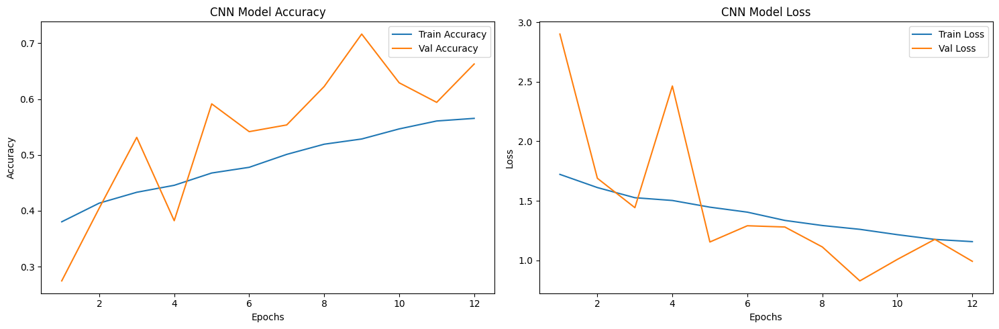

In [ ]:
acc_cnn = history_cnn.history['accuracy']
val_acc_cnn = history_cnn.history['val_accuracy']
loss_cnn = history_cnn.history['loss']
val_loss_cnn = history_cnn.history['val_loss']
epochs_range_cnn = range(1, len(history_cnn.epoch) + 1)


plt.figure(figsize=(15,5))

plt.subplot(1, 2, 1)
plt.plot(epochs_range_cnn, acc_cnn, label='Train Accuracy')
plt.plot(epochs_range_cnn, val_acc_cnn, label='Val Accuracy')
plt.legend(loc="best")
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('CNN Model Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range_cnn, loss_cnn, label='Train Loss')
plt.plot(epochs_range_cnn, val_loss_cnn, label='Val Loss')
plt.legend(loc="best")
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('CNN Model Loss')

plt.tight_layout()
plt.show()

# **Saving the Trained Simple CNN Model**

In [ ]:
cnn_model.save('Tomato_Disease_Prediction_SimpleCNN.h5')

# **Pickling the Model History**

In [ ]:
with open("Tomato_Disease_Prediction_SimpleCNN_history.pkl", "wb") as pickle_file:
    pickle.dump(history_cnn.history, pickle_file)

# **Preserving the Class Mappings**

In [ ]:
with open('Tomato_Disease_Prediction_SimpleCNN_Class_Mappings.pkl', 'wb') as f:
    pickle.dump(train_generator.class_indices, f)

# **Loading the Trained Simple_CNN Model**

In [ ]:
Simple_CNN_trained = load_model('/kaggle/working/Tomato_Disease_Prediction_SimpleCNN.h5')

# **Evaluating the Accuracy and Loss for the Training Set**

In [ ]:
Simple_CNN_trained.evaluate( train_generator )

647/647 ━━━━━━━━━━━━━━━━━━━━ 64s 98ms/step - accuracy: 0.7395 - loss: 0.7810


[0.7812885642051697, 0.7354932427406311]

# **Evaluating the Accuracy and Loss for the Testing Set**

In [ ]:
Simple_CNN_trained.evaluate( test_generator )

209/209 ━━━━━━━━━━━━━━━━━━━━ 28s 135ms/step - accuracy: 0.7496 - loss: 0.9344


[0.8149469494819641, 0.7248241901397705]

# **Generating the Confusion Matrix**

209/209 ━━━━━━━━━━━━━━━━━━━━ 23s 109ms/step


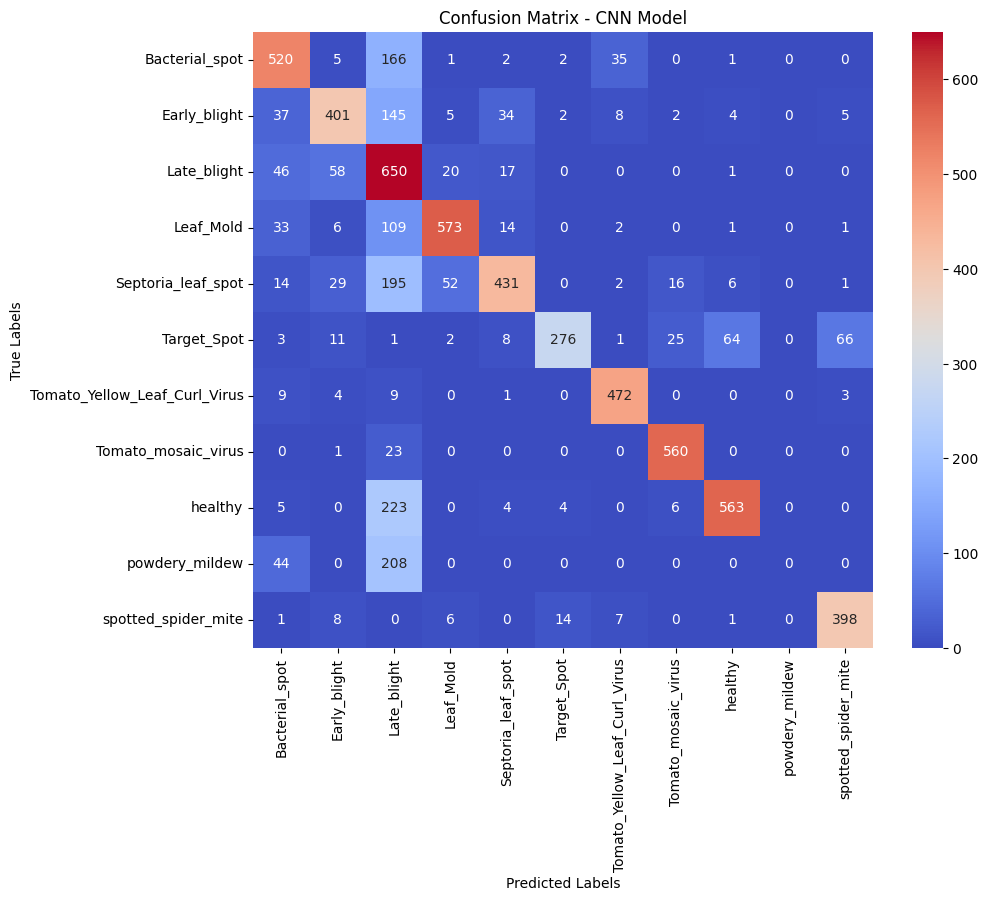

In [ ]:
test_generator.reset()
y_pred_prob_cnn = Simple_CNN_trained.predict(test_generator)
y_pred_cnn = np.argmax(y_pred_prob_cnn, axis=1)
y_true = test_generator.classes


cm_cnn = confusion_matrix(y_true, y_pred_cnn)

plt.figure(figsize = (10, 8))
sns.heatmap(cm_cnn, annot = True, fmt = 'd', cmap = 'coolwarm',
            xticklabels = test_generator.class_indices.keys(),
            yticklabels = test_generator.class_indices.keys())
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix - CNN Model')
plt.show()

# **Classification Report**

In [ ]:
print("CNN Classification Report:")
print(classification_report(y_true, y_pred_cnn, target_names = test_generator.class_indices.keys()))

CNN Classification Report:
                               precision    recall  f1-score   support

               Bacterial_spot       0.73      0.71      0.72       732
                 Early_blight       0.77      0.62      0.69       643
                  Late_blight       0.38      0.82      0.52       792
                    Leaf_Mold       0.87      0.78      0.82       739
           Septoria_leaf_spot       0.84      0.58      0.69       746
                  Target_Spot       0.93      0.60      0.73       457
Tomato_Yellow_Leaf_Curl_Virus       0.90      0.95      0.92       498
          Tomato_mosaic_virus       0.92      0.96      0.94       584
                      healthy       0.88      0.70      0.78       805
               powdery_mildew       0.00      0.00      0.00       252
          spotted_spider_mite       0.84      0.91      0.88       435

                     accuracy                           0.72      6683
                    macro avg       0.73      0.

**Application of Resnet50**

In [ ]:
# Define number of classes
NUM_CLASSES = 11

# Load ResNet50 base model
base_model_resnet = ResNet50(weights='imagenet', include_top=False, input_shape=(IMG_SIZE, IMG_SIZE, 3))

# Add custom layers
x = base_model_resnet.output
x = GlobalAveragePooling2D()(x)
x = BatchNormalization()(x)
x = Dense(128, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(NUM_CLASSES, activation='softmax')(x)

# Create the model
resnet_model = Model(inputs=base_model_resnet.input, outputs=predictions)

# Compile the model
optimizer = Adam(learning_rate=0.001)
resnet_model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])


NameError: name 'IMG_SIZE' is not defined

In [ ]:
# Train the ResNet50 model
history_resnet = resnet_model.fit(
    train_generator,
    epochs=25,
    validation_data=val_generator,
    callbacks=[early_stopping]
)


In [ ]:
# Plot training results
acc_resnet = history_resnet.history['accuracy']
val_acc_resnet = history_resnet.history['val_accuracy']
loss_resnet = history_resnet.history['loss']
val_loss_resnet = history_resnet.history['val_loss']
epochs_range_resnet = range(1, len(history_resnet.epoch) + 1)

plt.figure(figsize=(15, 5))

# Accuracy
plt.subplot(1, 2, 1)
plt.plot(epochs_range_resnet, acc_resnet, label='Train Set')
plt.plot(epochs_range_resnet, val_acc_resnet, label='Val Set')
plt.legend(loc="best")
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('ResNet50 Model Accuracy')

# Loss
plt.subplot(1, 2, 2)
plt.plot(epochs_range_resnet, loss_resnet, label='Train Set')
plt.plot(epochs_range_resnet, val_loss_resnet, label='Val Set')
plt.legend(loc="best")
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('ResNet50 Model Loss')

plt.tight_layout()
plt.show()

In [ ]:
resnet_model.save('Tomato_Disease_Prediction_ResNet50.h5')

In [ ]:
with open("Tomato_Disease_Prediction_ResNet50_history.pkl", "wb") as pickle_file:
    pickle.dump(history_cnn.history, pickle_file)

In [ ]:
with open('Tomato_Disease_Prediction_ResNet50_Class_Mappings.pkl', 'wb') as f:
    pickle.dump(train_generator.class_indices, f)

In [ ]:
ResNet50_trained = load_model('/kaggle/working/Tomato_Disease_Prediction_ResNet50.h5')

In [ ]:
ResNet50_trained.evaluate( train_generator )

In [ ]:
ResNet50_trained.evaluate( test_generator )

In [ ]:
test_generator.reset()
y_pred_prob_resnet = ResNet50_trained.predict(test_generator)
y_pred_resnet = np.argmax(y_pred_prob_resnet, axis=1)
y_true = test_generator.classes


cm_resnet = confusion_matrix(y_true, y_pred_cnn)

plt.figure(figsize = (10, 8))
sns.heatmap(cm_resnet, annot = True, fmt = 'd', cmap = 'coolwarm',
            xticklabels = test_generator.class_indices.keys(),
            yticklabels = test_generator.class_indices.keys())
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix - ResNet50 Model')
plt.show()

In [ ]:
print("ResNet Classification Report:")
print(classification_report(y_true, y_pred_resnet, target_names = test_generator.class_indices.keys()))

<div style="text-align: center; font-size: 24px; font-weight: bold;">
Models Comparison<br>EfficientB0 vs. Simple CNN vs RestNet50
</div>

In [ ]:
# Function to extract history dictionary
def extract_history(history_obj):
    if isinstance(history_obj, dict):
        return history_obj
    elif hasattr(history_obj, 'history'):
        return history_obj.history
    else:
        raise TypeError("Loaded object is neither a dict nor a Keras History object.")


# Loading the EfficientNetB0 history
with open('/kaggle/input/trained-efficientb0/Tomato_Disease_Prediction_EfficientB0_history', 'rb') as f:
    loaded_eff = pickle.load(f)

# Loading the Simple CNN history
with open('/kaggle/working/Tomato_Disease_Prediction_SimpleCNN_history.pkl', 'rb') as f:
    loaded_cnn = pickle.load(f)

# Loading the Simple ResNet50 history
with open('/kaggle/working/Tomato_Disease_Prediction_ResNet50_history.pkl', 'rb') as f:
    loaded_resnet = pickle.load(f)


# Extract history dictionaries
history_eff = extract_history(loaded_eff)
history_cnn = extract_history(loaded_cnn)
history_resnet = extract_history(loaded_resnet)

# Verifying the keys
print("EfficientNetB0 History Keys:", history_eff.keys())
print("Simple CNN History Keys:", history_cnn.keys())
print("ResNet50 History Keys:", history_resnet.keys())

EfficientNetB0 History Keys: dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])
Simple CNN History Keys: dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])


# **Comparing Accuracy and Loss Plots**

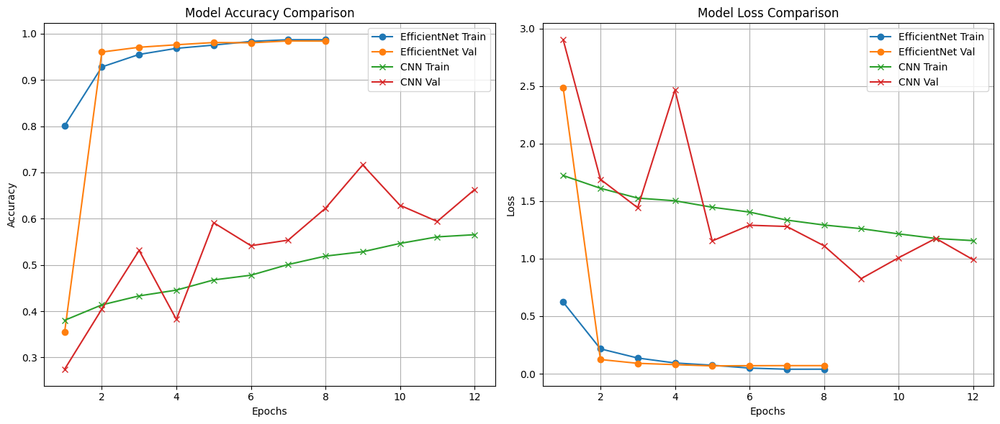

EfficientNetB0 Test Accuracy: 97.89%
CNN Model Test Accuracy: 71.30%


EfficientNetB0 Test Loss: 0.08
CNN Model Test Loss: 0.80


In [ ]:
epochs_eff = range(1, len(history_eff['accuracy']) + 1)
epochs_cnn = range(1, len(history_cnn['accuracy']) + 1)
epochs_resnet = range(1, len(history_resnet['accuracy']) + 1)

plt.figure(figsize = (14, 6))

# Accuracy Comparison
plt.subplot(1, 2, 1)
plt.plot(epochs_eff, history_eff['accuracy'], label = 'EfficientNet Train', marker = 'o')
plt.plot(epochs_eff, history_eff['val_accuracy'], label = 'EfficientNet Val', marker = 'o')
plt.plot(epochs_cnn, history_cnn['accuracy'], label = 'CNN Train', marker = 'x')
plt.plot(epochs_cnn, history_cnn['val_accuracy'], label = 'CNN Val', marker = 'x')
plt.plot(epochs_resnet, history_resnet['accuracy'], label = 'ResNet Train', marker = '|')
plt.plot(epochs_resnet, history_resnet['val_accuracy'], label = 'ResNet Val', marker = '|')
plt.title("Model Accuracy Comparison")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.legend()
plt.grid(True)

# Loss Comparison
plt.subplot(1, 2, 2)
plt.plot(epochs_eff, history_eff['loss'], label = 'EfficientNet Train', marker = 'o')
plt.plot(epochs_eff, history_eff['val_loss'], label = 'EfficientNet Val', marker = 'o')
plt.plot(epochs_cnn, history_cnn['loss'], label = 'CNN Train', marker = 'x')
plt.plot(epochs_cnn, history_cnn['val_loss'], label = 'CNN Val', marker = 'x')
plt.plot(epochs_resnet, history_resnet['loss'], label = 'ResNet Train', marker = '|')
plt.plot(epochs_resnet, history_resnet['val_loss'], label = 'ResNet Val', marker = '|')
plt.title("Model Loss Comparison")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()


# Comparing the accuracies
print(f"EfficientNetB0 Test Accuracy: {test_acc * 100:.2f}%")
print(f"CNN Model Test Accuracy: {test_acc_cnn * 100:.2f}%")
print(f"ResNet50 Model Test Accuracy: {test_acc * 100:.2f}%")

# Comparing the losses
print(f"\n\nEfficientNetB0 Test Loss: {test_loss:.2f}")
print(f"CNN Model Test Loss: {test_loss_cnn:.2f}")
print(f"RestNet50 Model Test Loss: {test_loss_cnn:.2f}")

# **Using the Best Model (EfficientB0) to Make Predictions Using Flask**

In [ ]:
!apt-get install -y unrar

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
unrar is already the newest version (1:6.1.5-1).
0 upgraded, 0 newly installed, 0 to remove and 49 not upgraded.


In [ ]:
!unrar x /content/Flask.rar


UNRAR 6.11 beta 1 freeware      Copyright (c) 1993-2022 Alexander Roshal


Extracting from /content/Flask.rar

Creating    Flask                                                     OK
Creating    Flask/Prediction                                          OK
Extracting  Flask/Prediction/app.py                                       57%  OK 
Creating    Flask/Prediction/static                                   OK
Extracting  Flask/Prediction/static/style.css                             74%  OK 
Creating    Flask/Prediction/templates                                OK
Extracting  Flask/Prediction/templates/index.html                         93%  OK 
All OK


In [ ]:
!unrar x "/content/Images To Predict.rar"


UNRAR 6.11 beta 1 freeware      Copyright (c) 1993-2022 Alexander Roshal


Extracting from /content/Images To Predict.rar

Creating    Images To Predict                                         OK
Extracting  Images To Predict/Early blight.jpg                            86%  OK 
Extracting  Images To Predict/powdery mildew.jpg                          99%  OK 
All OK


In [ ]:
!python /content/Flask/Prediction/app.py

2025-01-23 13:22:56.688108: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-01-23 13:22:56.708751: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-01-23 13:22:56.714538: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-01-23 13:22:57.854125: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
I0000 00:00:1737638582.151442    1589 cuda_executor.cc:1015] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/b